# Importing Necessary Libraries

In [1]:
import pandas as pd  # for data manipulation
import numpy as np # for numericals operation
import os

import seaborn as sns # for creating statistical Visualizations
from plotly.subplots import make_subplots
import plotly.express as px #High-level interface for interactive visualizations.
import seaborn as sns #Statistical data visualization library.
import matplotlib.pyplot as plt #MATLAB-like interface for creating plots.
import plotly.graph_objects as go #Low-level interface for customizable plots.

from sklearn.preprocessing import MinMaxScaler # import normalization features

from sklearn.model_selection import train_test_split #Splitting datasets into training and testing subsets.
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score #Compute mean squared error,coefficient of determination.

from sklearn.linear_model import LinearRegression # import linear regression model
from sklearn.svm import SVR # import support vector regression model



# Importing all dataset and Merging

In [2]:
folder_path = 'C:\\Users\\dell\\Desktop\\College diaries\\Sixth Sem\\DAML\\Assignment 2 - Individual\\Livestock_Nepal\\Part 2'


# Get a list of all CSV files in the folder
csv_files = [file for file in os.listdir(folder_path) if file.endswith('.csv')]

# Initialize an empty list to store dataframes
dfs = []

# Loop through each CSV file, read it as a dataframe, and append to dfs list
for file in csv_files:
    file_path = os.path.join(folder_path, file)
    df = pd.read_csv(file_path)
    dfs.append(df)

# Concatenate all dataframes in the list along the rows (axis=0)
concatenated_df = pd.concat(dfs, axis=1)

# Now you have a single dataframe containing all the data from the CSV files
# Perform your preprocessing steps on concatenated_df

In [3]:
concatenated_df

,DISTRICT,Horses/Asses,DISTRICT,MILKING COWS NO.,MILKING BUFFALOES NO.,COW MILK,BUFF MILK,TOTAL MILK PRODUCED,DISTRICT,BUFF,...,HEN EGG,DUCK EGG,TOTAL EGG,DISTRICT,Rabbit,DISTRICT,SHEEPS NO.,SHEEP WOOL PRODUCED,DISTRICT,YAK/NAK/CHAURI
0,TAPLEJUNG,543.0,TAPLEJUNG,8123,4987,5389,4257,9645.0,TAPLEJUNG,607,...,2420,25,2445,TAPLEJUNG,506.0,TAPLEJUNG,5777,3519,TAPLEJUNG,3465.0
1,SANKHUWASHAVA,358.0,SANKHUWASHAVA,15342,13367,6988,10589,17577.0,SANKHUWASABHA,1646,...,5506,34,5540,SANKHUWASHAVA,313.0,SANKHUWASHAVA,12181,9050,SANKHUWASHAVA,3945.0
2,SOLUKHUMBU,1775.0,SOLUKHUMBU,7819,13501,2948,5493,8441.0,SOLUKHUMBU,1123,...,2345,28,2373,SOLUKHUMBU,105.0,SOLUKHUMBU,8461,6286,SOLUKHUMBU,12235.0
3,PANCHTHAR,15.0,E.MOUNTAIN,31284,31855,15324,20339,35663.0,E.MOUNTAIN,3376,...,10271,87,10358,PANCHTHAR,29.0,E.MOUNTAIN,26419,18855,PANCHTHAR,1075.0
4,ILLAM,2815.0,PANCHTHAR,14854,11331,8511,9835,18346.0,PANCHTHAR,1496,...,5581,19,5600,ILLAM,240.0,PANCHTHAR,1338,994,ILLAM,165.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91,NaN,NaN,KAILALI,27758,41103,27905,36677,64582.0,KAILALI,5962,...,16928,275,17203,NaN,NaN,KAILALI,21267,15801,NaN,NaN
92,NaN,NaN,KANCHANPUR,20164,27812,23146,25876,49022.0,KANCHANPUR,3816,...,13483,155,13638,NaN,NaN,KANCHANPUR,7953,5909,NaN,NaN
93,NaN,NaN,FW.TERAI,47922,68915,51051,62553,113604.0,FW.TERAI,9778,...,30411,430,30841,NaN,NaN,FW.TERAI,29220,21710,NaN,NaN
94,NaN,NaN,FW. REGION,130595,132257,87936,112438,200374.0,FW.REGION,18154,...,40743,504,41247,NaN,NaN,FW.REGION,102571,76314,NaN,NaN


# importing individual dataset

In [4]:
# Loading datasets
df1 = pd.read_csv('horseasses-population-in-nepal-by-district.csv')
df2 = pd.read_csv('milk-animals-and-milk-production-in-nepal-by-district.csv')
df3 = pd.read_csv('net-meat-production-in-nepal-by-district.csv')
df4 = pd.read_csv('production-of-cotton-in-nepal-by-district.csv')
df5 = pd.read_csv('production-of-egg-in-nepal-by-district.csv')
df6 = pd.read_csv('rabbit-population-in-nepal-by-district.csv')
df7 = pd.read_csv('wool-production-in-nepal-by-district.csv')
df8 = pd.read_csv('yak-nak-chauri-population-in-nepal-by-district.csv')

# Data Exploration

In [5]:
print("df1: ")
display(df1.head(5))
print("df2: ")
display(df2.head(5))
print("df3: ")
display(df3.head(5))
print("df4: ")
display(df4.head(5))
print("df5: ")
display(df5.head(5))
print("df6: ")
display(df6.head(5))
print("df7: ")
display(df7.head(5))
print("df8: ")
display(df8.head(5))

df1: 


,DISTRICT,Horses/Asses
0,TAPLEJUNG,543
1,SANKHUWASHAVA,358
2,SOLUKHUMBU,1775
3,PANCHTHAR,15
4,ILLAM,2815


df2: 


,DISTRICT,MILKING COWS NO.,MILKING BUFFALOES NO.,COW MILK,BUFF MILK,TOTAL MILK PRODUCED
0,TAPLEJUNG,8123,4987,5389,4257,9645.0
1,SANKHUWASHAVA,15342,13367,6988,10589,17577.0
2,SOLUKHUMBU,7819,13501,2948,5493,8441.0
3,E.MOUNTAIN,31284,31855,15324,20339,35663.0
4,PANCHTHAR,14854,11331,8511,9835,18346.0


df3: 


,DISTRICT,BUFF,MUTTON,CHEVON,PORK,CHICKEN,DUCK MEAT,TOTAL MEAT
0,TAPLEJUNG,607,31,491,443,172,0,1744
1,SANKHUWASABHA,1646,41,958,509,302,1,3457
2,SOLUKHUMBU,1123,28,416,428,166,0,2161
3,E.MOUNTAIN,3376,100,1865,1380,640,1,7362
4,PANCHTHAR,1496,4,940,730,248,1,3419


df4: 


,DISTRICT,AREA (Ha.),PROD. (Mt.),YIELD Kg/Ha
0,Dang,106,74,700
1,Banke,27,41,1519
2,Bardiya,10,12,1200
3,NEPAL,143,127,890


df5: 


,DISTRICT,LAYING HEN,LAYING DUCK,HEN EGG,DUCK EGG,TOTAL EGG
0,TAPLEJUNG,15366.0,341,2420,25,2445
1,SANKHUWASHAVA,77512.0,465,5506,34,5540
2,SOLUKHUMBU,42671.0,374,2345,28,2373
3,E.MOUNTAIN,135548.0,1180,10271,87,10358
4,PANCHTHAR,63779.0,261,5581,19,5600


df6: 


,DISTRICT,Rabbit
0,TAPLEJUNG,506
1,SANKHUWASHAVA,313
2,SOLUKHUMBU,105
3,PANCHTHAR,29
4,ILLAM,240


df7: 


,DISTRICT,SHEEPS NO.,SHEEP WOOL PRODUCED
0,TAPLEJUNG,5777,3519
1,SANKHUWASHAVA,12181,9050
2,SOLUKHUMBU,8461,6286
3,E.MOUNTAIN,26419,18855
4,PANCHTHAR,1338,994


df8: 


,DISTRICT,YAK/NAK/CHAURI
0,TAPLEJUNG,3465
1,SANKHUWASHAVA,3945
2,SOLUKHUMBU,12235
3,PANCHTHAR,1075
4,ILLAM,165


# merging all dataset with common DISTRICT column

In [6]:
dfs = [df1, df2, df3, df4, df5, df6, df7, df8]
# Merge dataframes using outer join
merged_df = pd.merge(dfs[0], dfs[1], on='DISTRICT', how='outer')
for df in dfs[2:]:
    merged_df = pd.merge(merged_df, df, on='DISTRICT', how='outer')

In [7]:
merged_df

,DISTRICT,Horses/Asses,MILKING COWS NO.,MILKING BUFFALOES NO.,COW MILK,BUFF MILK,TOTAL MILK PRODUCED,BUFF,MUTTON,CHEVON,...,YIELD Kg/Ha,LAYING HEN,LAYING DUCK,HEN EGG,DUCK EGG,TOTAL EGG,Rabbit,SHEEPS NO.,SHEEP WOOL PRODUCED,YAK/NAK/CHAURI
0,TAPLEJUNG,543.0,8123.0,4987.0,5389.0,4257.0,9645.0,607.0,31.0,491.0,...,NaN,15366.0,341.0,2420.0,25.0,2445.0,506.0,5777.0,3519.0,3465.0
1,SANKHUWASHAVA,358.0,15342.0,13367.0,6988.0,10589.0,17577.0,NaN,NaN,NaN,...,NaN,77512.0,465.0,5506.0,34.0,5540.0,313.0,12181.0,9050.0,3945.0
2,SOLUKHUMBU,1775.0,7819.0,13501.0,2948.0,5493.0,8441.0,1123.0,28.0,416.0,...,NaN,42671.0,374.0,2345.0,28.0,2373.0,105.0,8461.0,6286.0,12235.0
3,PANCHTHAR,15.0,14854.0,11331.0,8511.0,9835.0,18346.0,1496.0,4.0,940.0,...,NaN,63779.0,261.0,5581.0,19.0,5600.0,29.0,1338.0,994.0,1075.0
4,ILLAM,2815.0,26821.0,5759.0,19735.0,15261.0,34996.0,1974.0,1.0,870.0,...,NaN,26781.0,332.0,6656.0,27.0,6683.0,240.0,160.0,118.0,165.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
103,SANKHUWASABHA,NaN,NaN,NaN,NaN,NaN,NaN,1646.0,41.0,958.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
104,Dang,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,700.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
105,Banke,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1519.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
106,Bardiya,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1200.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [8]:
merged_df.info() # it gives the basic info like data types total columns rows etc

<class 'pandas.core.frame.DataFrame'>
Int64Index: 108 entries, 0 to 107
Data columns (total 26 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   DISTRICT                108 non-null    object 
 1   Horses/Asses            60 non-null     float64
 2   MILKING  COWS NO.       96 non-null     float64
 3   MILKING  BUFFALOES NO.  96 non-null     float64
 4   COW MILK                96 non-null     float64
 5   BUFF MILK               96 non-null     float64
 6   TOTAL MILK PRODUCED     95 non-null     float64
 7   BUFF                    96 non-null     float64
 8   MUTTON                  96 non-null     float64
 9   CHEVON                  96 non-null     float64
 10  PORK                    96 non-null     float64
 11  CHICKEN                 96 non-null     float64
 12  DUCK MEAT               96 non-null     float64
 13  TOTAL MEAT              96 non-null     float64
 14  AREA (Ha.)              4 non-null      fl

In [9]:
merged_df.describe() #overall it provides stats info about all the columns

,Horses/Asses,MILKING COWS NO.,MILKING BUFFALOES NO.,COW MILK,BUFF MILK,TOTAL MILK PRODUCED,BUFF,MUTTON,CHEVON,PORK,...,YIELD Kg/Ha,LAYING HEN,LAYING DUCK,HEN EGG,DUCK EGG,TOTAL EGG,Rabbit,SHEEPS NO.,SHEEP WOOL PRODUCED,YAK/NAK/CHAURI
count,60.000000,9.600000e+01,9.600000e+01,96.000000,9.600000e+01,95.000000,96.00000,96.000000,96.000000,96.000000,...,4.000000,9.600000e+01,96.000000,9.600000e+01,96.000000,9.600000e+01,55.000000,96.000000,96.000000,35.00000
mean,2790.400000,4.275562e+04,5.647433e+04,26825.260417,5.043505e+04,58555.189474,7291.87500,111.833333,2732.625000,979.541667,...,1077.250000,5.147298e+05,7538.625000,5.392358e+04,579.416667,5.450300e+04,1757.072727,33360.750000,24514.500000,5899.80000
std,8447.864779,1.144496e+05,1.508551e+05,71948.998086,1.358044e+05,96696.838132,19484.37418,314.001598,7245.635676,2713.977477,...,359.439726,1.536131e+06,21446.360692,1.650960e+05,1649.968112,1.665308e+05,4684.882317,94126.278004,69318.271646,12300.08377
min,12.000000,4.520000e+02,0.000000e+00,259.000000,0.000000e+00,259.000000,0.00000,0.000000,56.000000,1.000000,...,700.000000,1.488000e+03,3.000000,2.100000e+02,0.000000,2.110000e+02,19.000000,36.000000,13.000000,25.00000
25%,122.250000,8.074750e+03,1.020550e+04,4630.750000,9.085000e+03,14179.500000,1438.50000,10.000000,575.000000,114.000000,...,842.500000,3.319350e+04,317.750000,3.060750e+03,24.750000,3.099000e+03,179.000000,2637.500000,1958.750000,407.00000
50%,493.000000,1.513050e+04,1.954000e+04,8343.500000,1.710250e+04,28027.000000,2558.00000,31.000000,890.000000,326.000000,...,1045.000000,1.113675e+05,1422.500000,7.769500e+03,109.500000,7.978500e+03,506.000000,9130.500000,6414.500000,1075.00000
75%,1510.250000,2.600800e+04,3.674975e+04,15694.000000,3.110500e+04,43324.000000,4447.00000,90.750000,1689.500000,711.250000,...,1279.750000,3.037330e+05,4475.500000,3.172875e+04,326.250000,3.259750e+04,1135.500000,26427.250000,19054.500000,5556.00000
max,55808.000000,1.026135e+06,1.355384e+06,643806.000000,1.210441e+06,536299.000000,175005.00000,2684.000000,65583.000000,23509.000000,...,1519.000000,1.235352e+07,180927.000000,1.294166e+06,13906.000000,1.308072e+06,32213.000000,800658.000000,588348.000000,68831.00000


In [10]:
nan_counts = merged_df.isna().sum()
nan_counts

DISTRICT                    0
Horses/Asses               48
MILKING  COWS NO.          12
MILKING  BUFFALOES NO.     12
COW MILK                   12
BUFF MILK                  12
TOTAL MILK PRODUCED        13
BUFF                       12
MUTTON                     12
CHEVON                     12
PORK                       12
CHICKEN                    12
DUCK MEAT                  12
TOTAL MEAT                 12
AREA (Ha.)                104
PROD. (Mt.)               104
YIELD Kg/Ha               104
LAYING HEN                 12
LAYING DUCK                12
HEN EGG                    12
DUCK EGG                   12
TOTAL EGG                  12
Rabbit                     53
SHEEPS NO.                 12
SHEEP WOOL PRODUCED        12
YAK/NAK/CHAURI             73
dtype: int64

# Visualizing the missing values of all columns using heatmap

<Axes: >

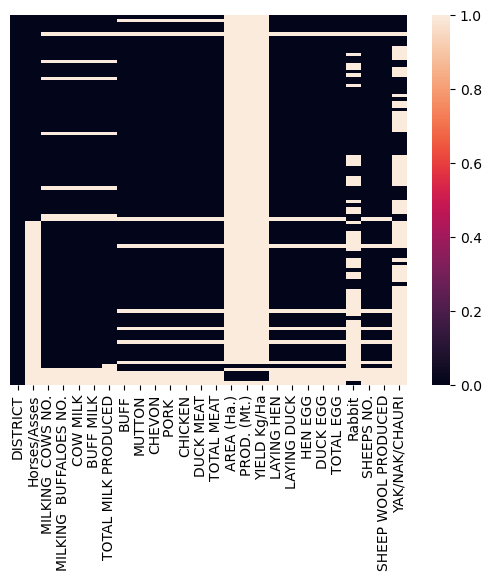

In [11]:
sns.heatmap(merged_df.isnull(), yticklabels = False) # Visulizing the missing values by using heatmap

# Deleting all the columns that contain null values more than 50% of rows

In [12]:
columns_to_delete = nan_counts[nan_counts > 54].index.tolist()

# Delete the specified columns
merged_df.drop(columns=columns_to_delete, inplace=True)

In [13]:
merged_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 108 entries, 0 to 107
Data columns (total 22 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   DISTRICT                108 non-null    object 
 1   Horses/Asses            60 non-null     float64
 2   MILKING  COWS NO.       96 non-null     float64
 3   MILKING  BUFFALOES NO.  96 non-null     float64
 4   COW MILK                96 non-null     float64
 5   BUFF MILK               96 non-null     float64
 6   TOTAL MILK PRODUCED     95 non-null     float64
 7   BUFF                    96 non-null     float64
 8   MUTTON                  96 non-null     float64
 9   CHEVON                  96 non-null     float64
 10  PORK                    96 non-null     float64
 11  CHICKEN                 96 non-null     float64
 12  DUCK MEAT               96 non-null     float64
 13  TOTAL MEAT              96 non-null     float64
 14  LAYING HEN              96 non-null     fl

In [14]:
merged_df.isna().sum()

DISTRICT                   0
Horses/Asses              48
MILKING  COWS NO.         12
MILKING  BUFFALOES NO.    12
COW MILK                  12
BUFF MILK                 12
TOTAL MILK PRODUCED       13
BUFF                      12
MUTTON                    12
CHEVON                    12
PORK                      12
CHICKEN                   12
DUCK MEAT                 12
TOTAL MEAT                12
LAYING HEN                12
LAYING DUCK               12
HEN EGG                   12
DUCK EGG                  12
TOTAL EGG                 12
Rabbit                    53
SHEEPS NO.                12
SHEEP WOOL PRODUCED       12
dtype: int64

# Data Pre - processing

In [15]:
merged_df['DISTRICT'] = merged_df['DISTRICT'].str.lower()


In [16]:
merged_df

,DISTRICT,Horses/Asses,MILKING COWS NO.,MILKING BUFFALOES NO.,COW MILK,BUFF MILK,TOTAL MILK PRODUCED,BUFF,MUTTON,CHEVON,...,DUCK MEAT,TOTAL MEAT,LAYING HEN,LAYING DUCK,HEN EGG,DUCK EGG,TOTAL EGG,Rabbit,SHEEPS NO.,SHEEP WOOL PRODUCED
0,taplejung,543.0,8123.0,4987.0,5389.0,4257.0,9645.0,607.0,31.0,491.0,...,0.0,1744.0,15366.0,341.0,2420.0,25.0,2445.0,506.0,5777.0,3519.0
1,sankhuwashava,358.0,15342.0,13367.0,6988.0,10589.0,17577.0,NaN,NaN,NaN,...,NaN,NaN,77512.0,465.0,5506.0,34.0,5540.0,313.0,12181.0,9050.0
2,solukhumbu,1775.0,7819.0,13501.0,2948.0,5493.0,8441.0,1123.0,28.0,416.0,...,0.0,2161.0,42671.0,374.0,2345.0,28.0,2373.0,105.0,8461.0,6286.0
3,panchthar,15.0,14854.0,11331.0,8511.0,9835.0,18346.0,1496.0,4.0,940.0,...,1.0,3419.0,63779.0,261.0,5581.0,19.0,5600.0,29.0,1338.0,994.0
4,illam,2815.0,26821.0,5759.0,19735.0,15261.0,34996.0,1974.0,1.0,870.0,...,0.0,3365.0,26781.0,332.0,6656.0,27.0,6683.0,240.0,160.0,118.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
103,sankhuwasabha,NaN,NaN,NaN,NaN,NaN,NaN,1646.0,41.0,958.0,...,1.0,3457.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
104,dang,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
105,banke,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
106,bardiya,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [17]:
merged_df = merged_df.drop_duplicates() # to remove the duplicate values
# Exclude the 'DISTRICT' column from the iteration
columns_to_visualize = merged_df.columns[1:]

# Printing Unique Values of All columns

In [18]:
# Iterate through columns except for the 'DISTRICT' column
for column in merged_df.columns[0:]:
    unique_values = merged_df[column].unique()
    print
    print(f"Unique values in '{column}' column: {unique_values}\n")

Unique values in 'DISTRICT' column: ['taplejung' 'sankhuwashava' 'solukhumbu' 'panchthar' 'illam' 'terathum'
 'bhojpur' 'khotang' 'okhaldhunga' 'udayapur' 'jhapa' 'morang' 'sunsari'
 'e.region' 'nuwakot' 'rautahat' 'bara' 'chitwan' 'c.region' 'manang'
 'mustang' 'gorkha' 'lamjung' 'tanahu' 'kaski' 'parbat' 'syangja' 'myagdi'
 'baglung' 'gulmi' 'arghakhanchi' 'nawalparasi' 'rupandehi' 'kapilbastu'
 'w.region' 'dolpa' 'mugu' 'jumla' 'humla' 'kalikot' 'rukum' 'rolpa'
 'pyuthan' 'salyan' 'jajarkot' 'dailekh' 'surkhet' 'dang' 'banke'
 'bardiya' 'mw.region' 'bajura' 'bajhang' 'darchula' 'achham' 'doti'
 'baitadi' 'dadeldhura' 'fw.region' 'total' 'e.mountain' 'terhathum'
 'dhankuta' 'e.hills' 'saptari' 'siraha' 'e.terai' 'e. region' 'dolakha'
 'sindhupalchok' 'rasuwa' 'c.mountain' 'ramechap' 'sindhuli' 'kavre'
 'bhaktapur' 'lalitpur' 'kathmandu' 'dhading' 'makwanpur' 'c.hills'
 'dhanusha' 'mahottari' 'sarlahi' 'parsa' 'c.terai' 'c. region'
 'w.mountain' 'palpa' 'w.hills' 'w.terai' 'w. region'

In [19]:
merged_df = merged_df[~(((merged_df['DISTRICT'].str.strip() == 'fw. region') | 
                         (merged_df['DISTRICT'].str.strip() == 'e. region') |
                         (merged_df['DISTRICT'].str.strip() == 'c. region')) |
                        (merged_df['DISTRICT'].str.strip().str.lower().isin(['nepal', 'total'])))]


# Data Visualization

In [20]:
# Define the number of rows and columns for subplots
num_rows = 7  # You can adjust this based on the number of columns you have
num_cols = 3

# Create subplots
fig = make_subplots(rows=num_rows, cols=num_cols)
# Exclude the 'DISTRICT' column from the iteration
columns_to_visualize = merged_df.columns[1:]
# Iterate through each column and add it to the subplots
for i, column in enumerate(columns_to_visualize):
    # Sort the DataFrame by the current column
    sorted_df = merged_df.sort_values(by=column)
    
    # Add a trace to the subplot
    fig.add_trace(go.Bar(x=sorted_df['DISTRICT'], y=sorted_df[column], name=column),
                  row=i // num_cols + 1, col=i % num_cols + 1)

# Update layout
fig.update_layout(height=2000, width=2000, title_text="Visualization of livestock according to District")

# Show the figure
fig.show()

In [21]:
# Define the number of rows and columns for subplots
num_rows = 7  # You can adjust this based on the number of columns you have
num_cols = 3

# Create subplots
fig = make_subplots(rows=num_rows, cols=num_cols)

# Iterate through each column and add box plots to the subplots
for i, column in enumerate(columns_to_visualize):
    # Add a box plot trace to the subplot
    fig.add_trace(go.Box(y=merged_df[column], name=column, boxpoints='all'),
                  row=i // num_cols + 1, col=i % num_cols + 1)

# Update layout
fig.update_layout(height=3000, width=1000, title_text="Box Plots")

# Show the figure
fig.show()

<Figure size 1000x600 with 0 Axes>

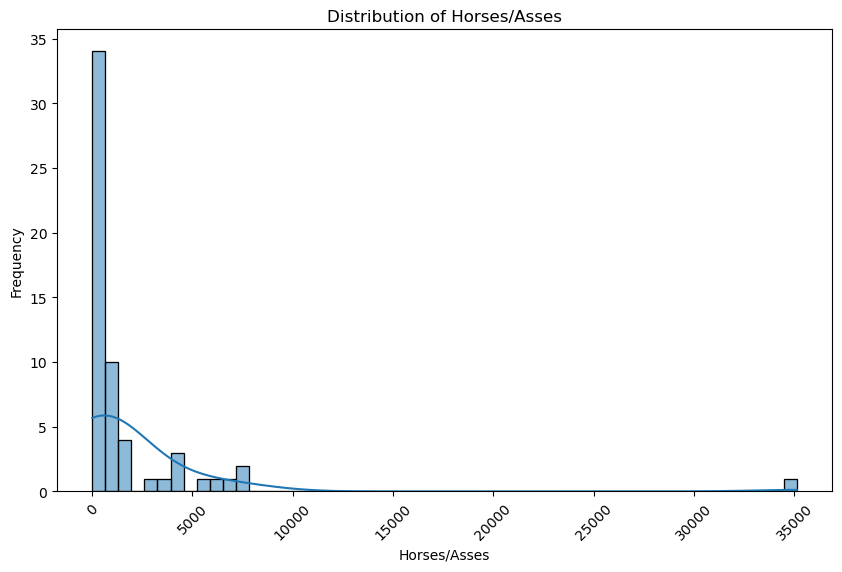

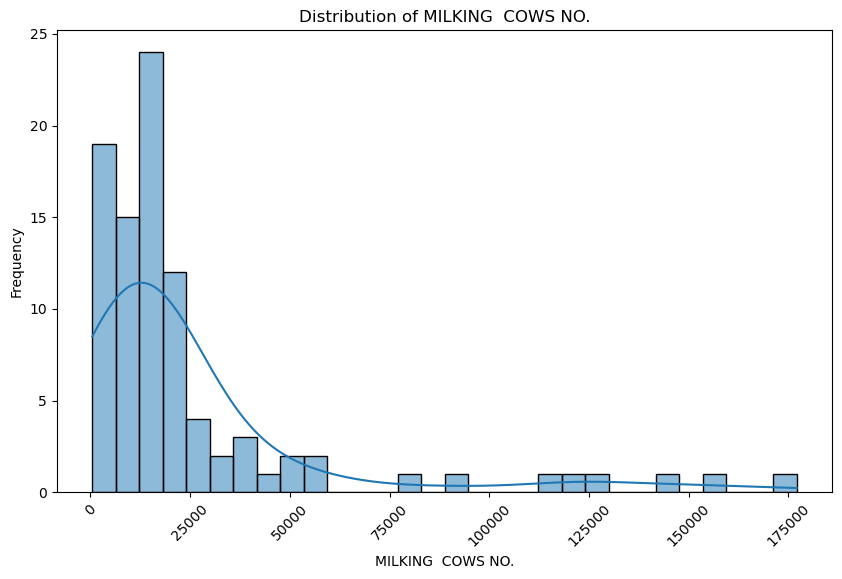

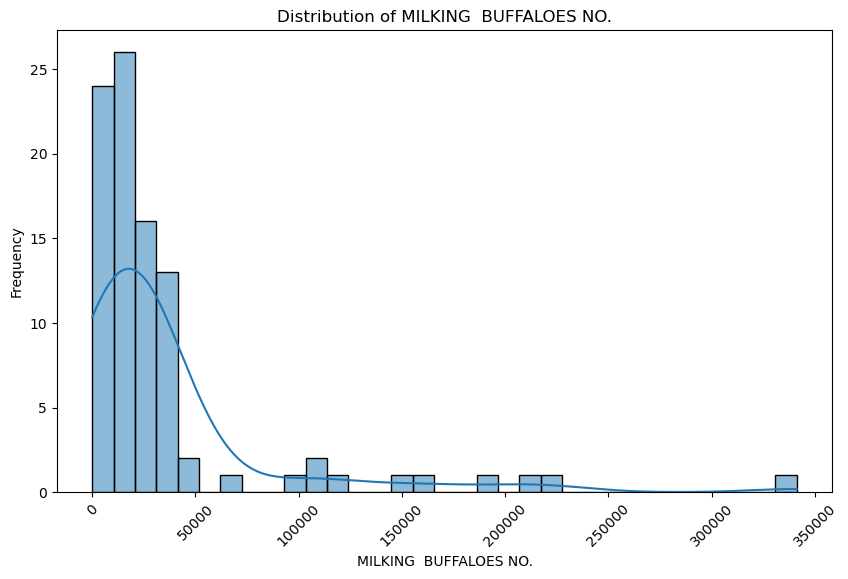

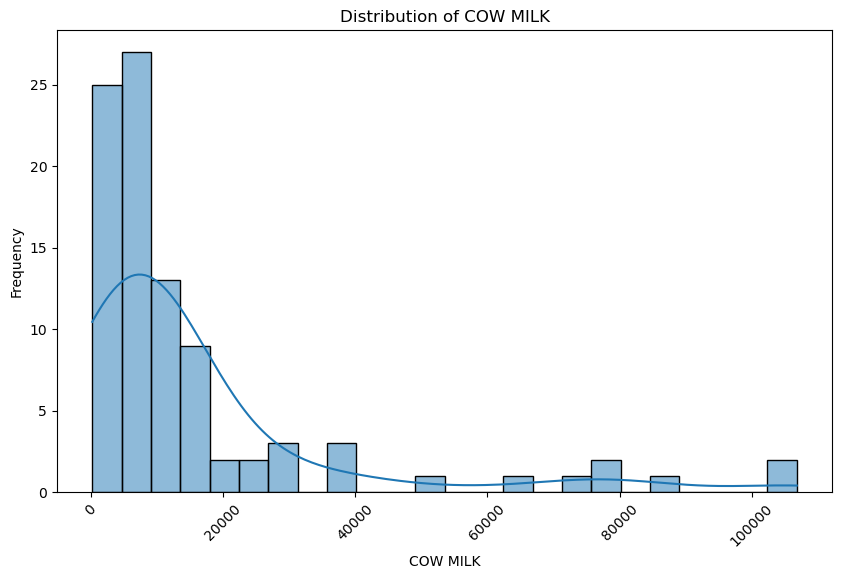

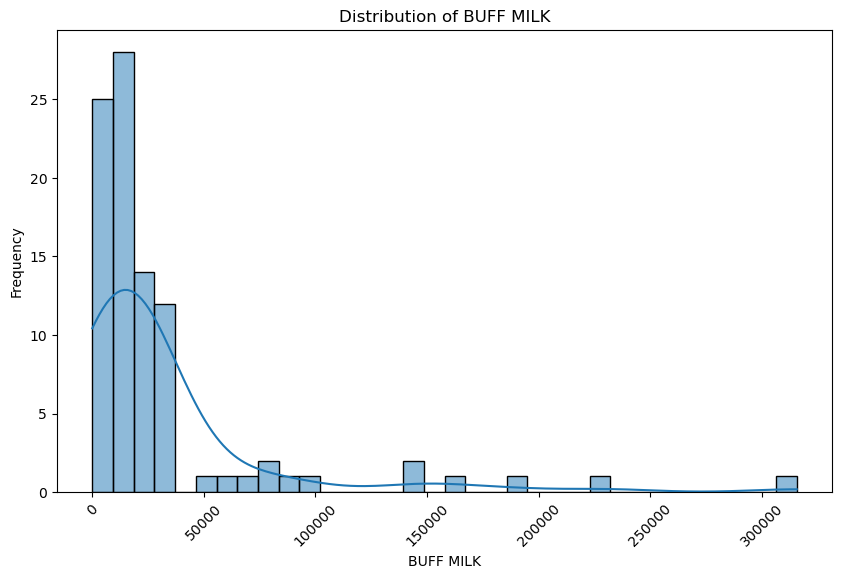

...

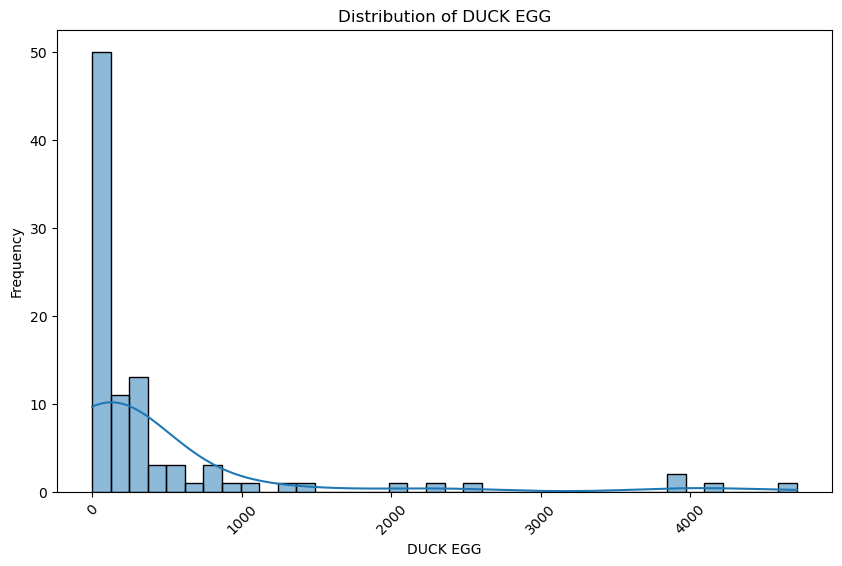

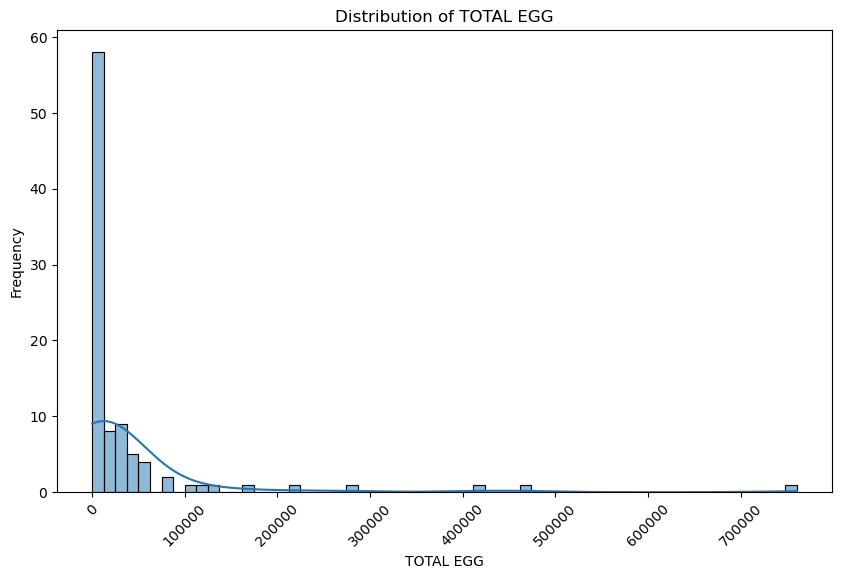

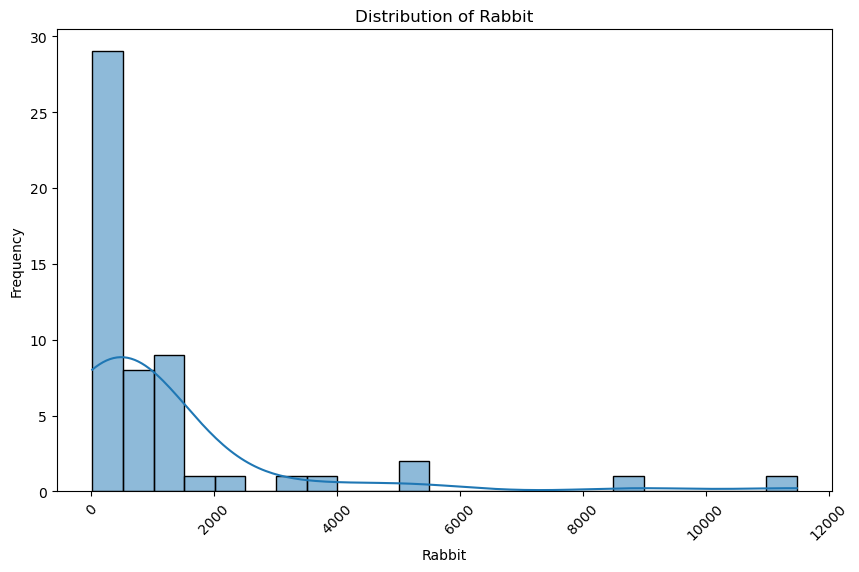

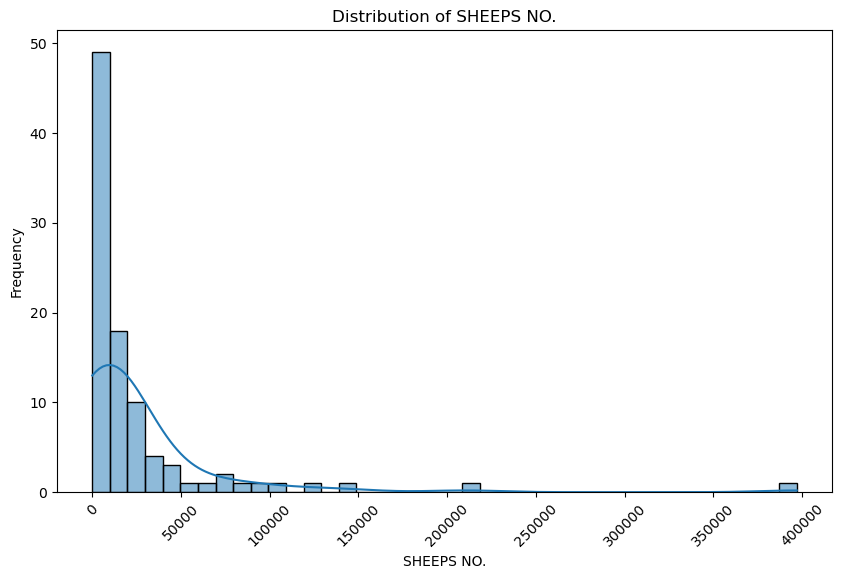

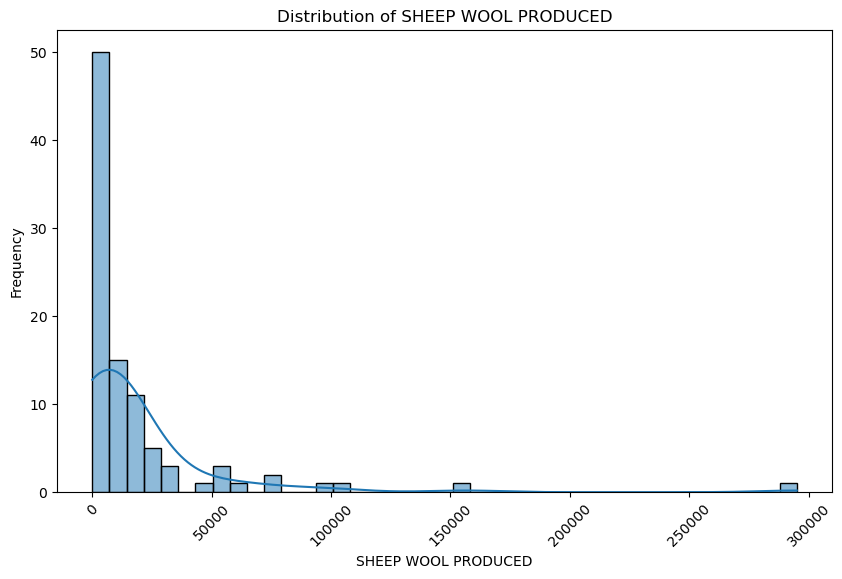

In [22]:
# Iterate through each column
for column in merged_df.columns:
    plt.figure(figsize=(10, 6))
    
    # Check if the column is not the 'DISTRICT' column
    if column != 'DISTRICT':
        # Determine the appropriate plot type based on the data type of the column
        if merged_df[column].dtype == 'object':
            # If the column contains categorical data, plot a bar chart
            sns.countplot(data=merged_df, x=column)
            plt.title(f'Count of {column}')
        elif merged_df[column].dtype in ['int64', 'float64']:
            # If the column contains numerical data, plot a histogram
            sns.histplot(data=merged_df, x=column, kde=True)
            plt.title(f'Distribution of {column}')
        plt.xlabel(column)
        plt.ylabel('Frequency')
        plt.xticks(rotation=45)
    
    plt.show()

In [23]:

# sns.pairplot(merged_df)
# plt.show()

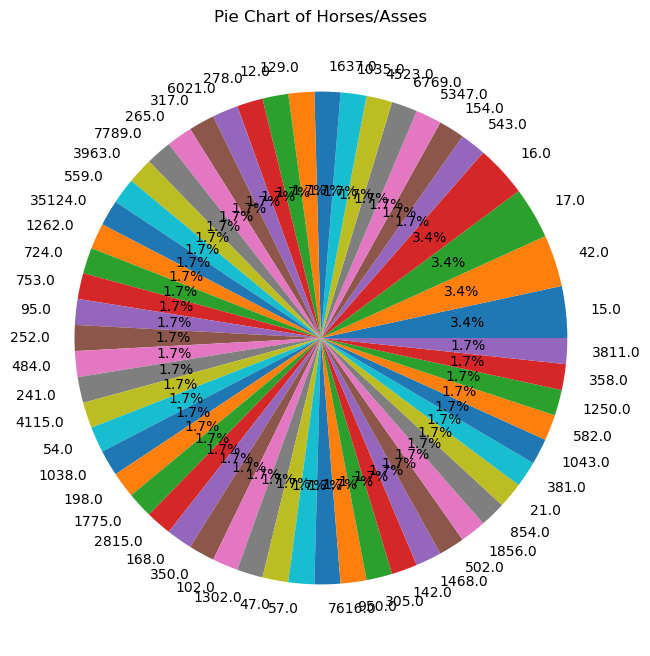

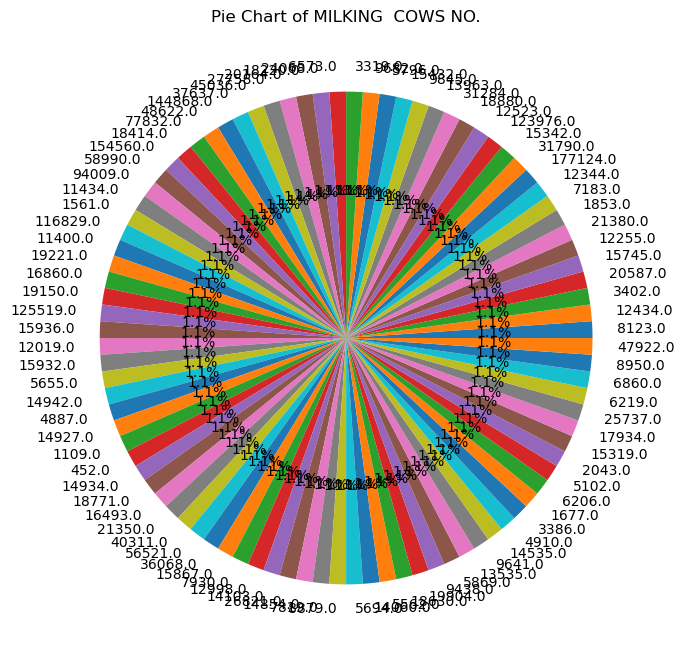

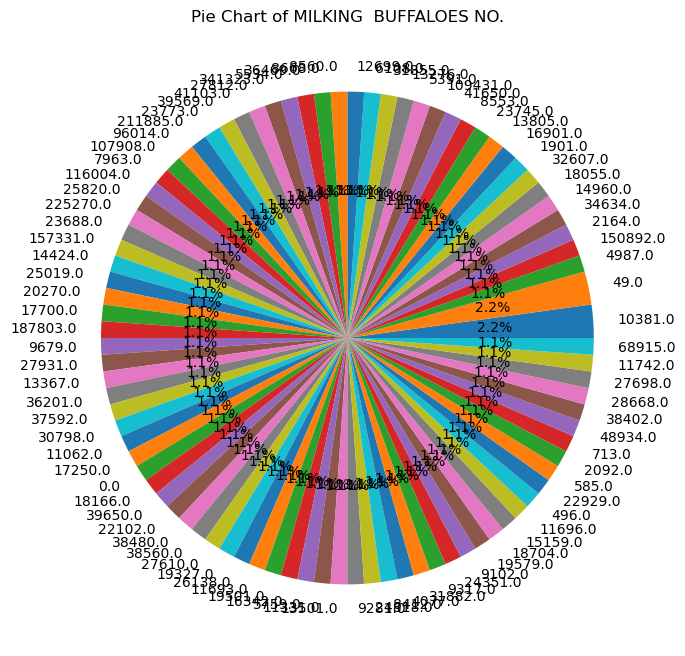

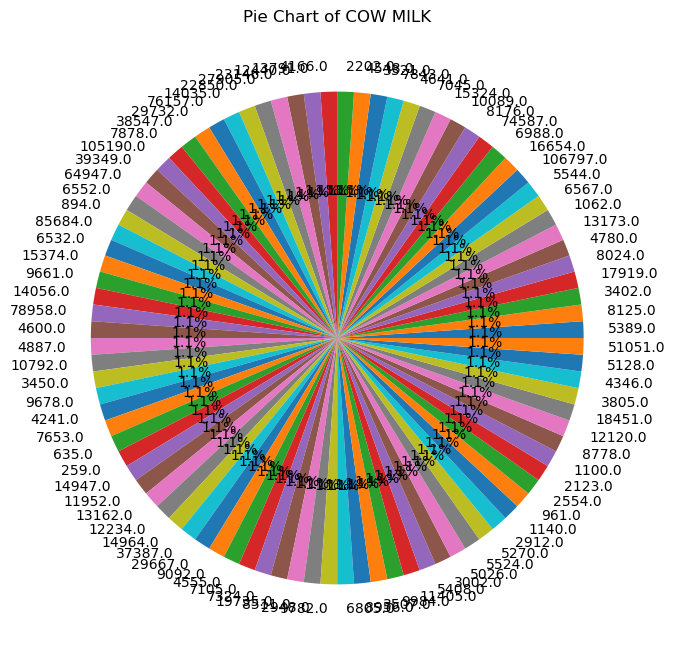

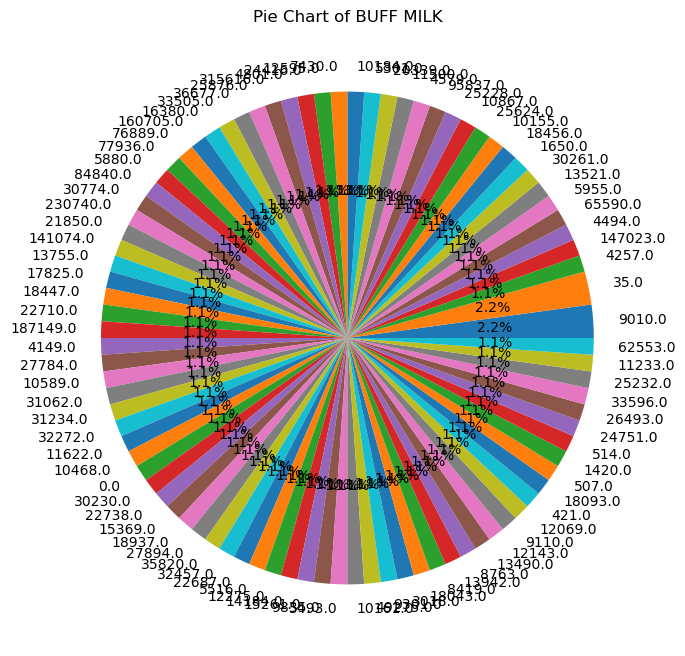

...

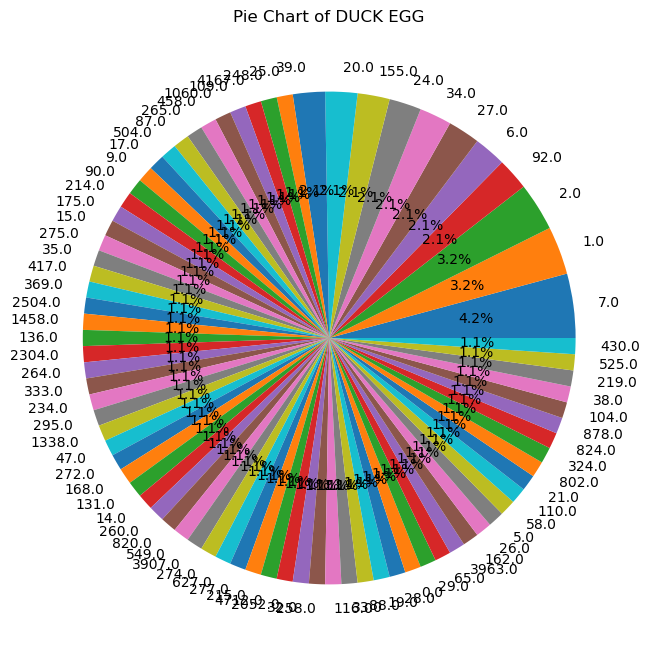

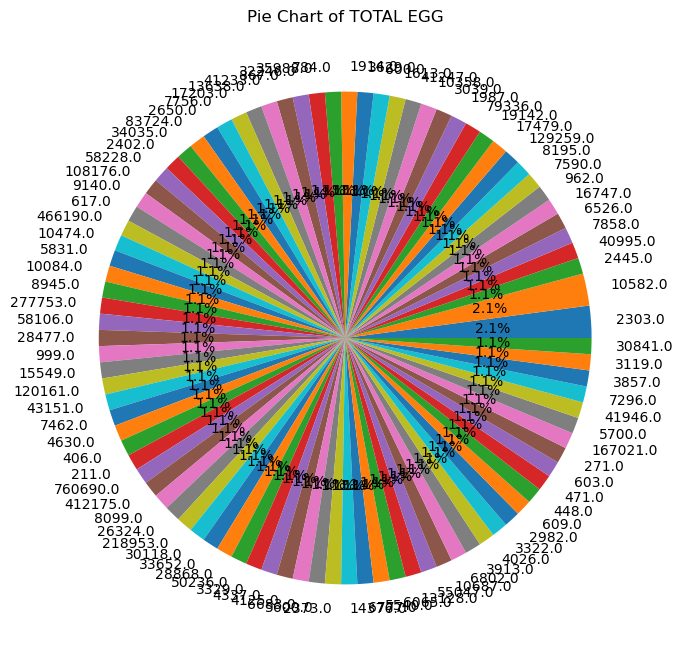

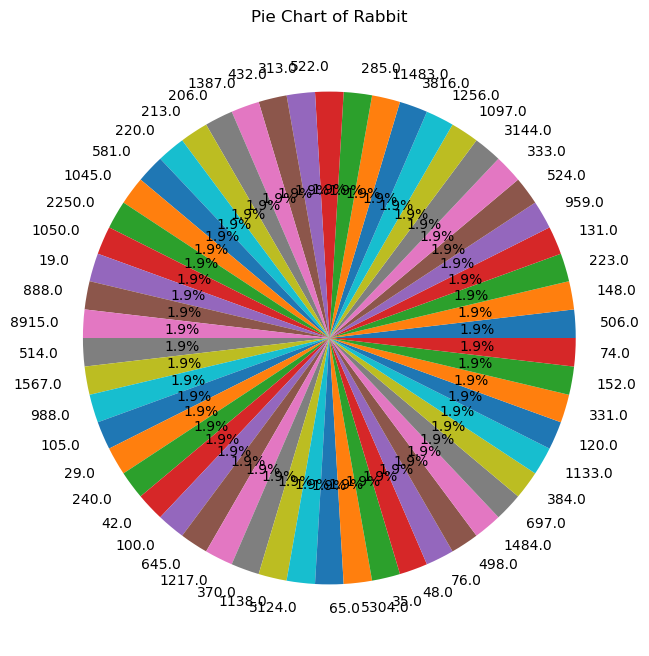

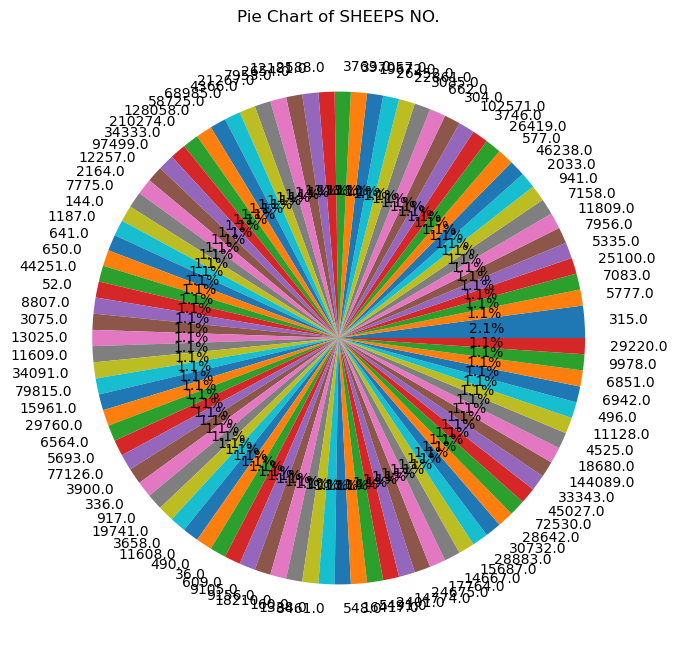

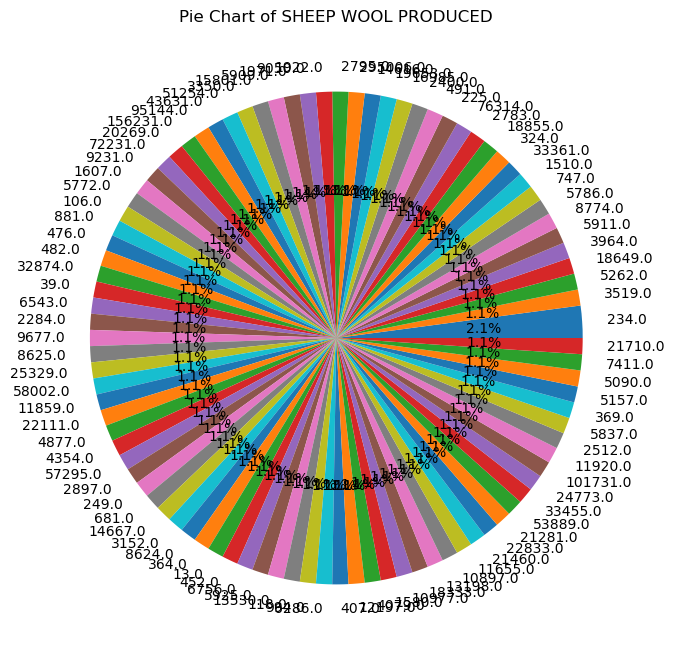

In [24]:
# Iterate through each column and create a pie chart
for column in merged_df.columns:
    if column != 'DISTRICT':  # Skip DISTRICT column or any other column you don't want to visualize
        plt.figure(figsize=(8, 8))
        plt.pie(merged_df[column].value_counts(), labels=merged_df[column].value_counts().index, autopct='%1.1f%%')
        plt.title(f'Pie Chart of {column}')
        plt.show()

In [25]:
# Define a function to remove outliers based on IQR
def remove_outliers(merged_df):
    Q1 = merged_df.quantile(0.25)
    Q3 = merged_df.quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return merged_df[(merged_df >= lower_bound) & (merged_df <= upper_bound)].dropna()

# Apply the function to numerical columns
numerical_columns = merged_df.select_dtypes(include=['number']).columns
df_cleaned = merged_df.copy()
for column in numerical_columns:
    df_cleaned[column] = remove_outliers(merged_df[column])

# Now df_cleaned contains the dataset with outliers removed

# Normalization

In [26]:

# Initialize MinMaxScaler
scaler = MinMaxScaler()

# Define columns to normalize excluding 'DISTRICT'
columns_to_normalize = [col for col in merged_df.columns if col != 'DISTRICT']

# Normalizing selected columns
merged_df[columns_to_normalize] = scaler.fit_transform(merged_df[columns_to_normalize])

print('\n NOrmalized Dataset: ')
merged_df



 NOrmalized Dataset: 


,DISTRICT,Horses/Asses,MILKING COWS NO.,MILKING BUFFALOES NO.,COW MILK,BUFF MILK,TOTAL MILK PRODUCED,BUFF,MUTTON,CHEVON,...,DUCK MEAT,TOTAL MEAT,LAYING HEN,LAYING DUCK,HEN EGG,DUCK EGG,TOTAL EGG,Rabbit,SHEEPS NO.,SHEEP WOOL PRODUCED
0,taplejung,0.015123,0.043419,0.014611,0.048152,0.013488,0.022319,0.012081,0.024545,0.025836,...,0.000000,0.016570,0.001950,0.005616,0.002921,0.005306,0.002938,0.042481,0.014460,0.011885
1,sankhuwashava,0.009854,0.084280,0.039162,0.063161,0.033550,0.041180,NaN,NaN,NaN,...,NaN,NaN,0.010682,0.007676,0.007000,0.007216,0.007007,0.025645,0.030590,0.030635
2,solukhumbu,0.050211,0.041699,0.039555,0.025240,0.017404,0.019456,0.022351,0.022169,0.021381,...,0.000000,0.020718,0.005787,0.006164,0.002822,0.005942,0.002843,0.007502,0.021221,0.021265
3,panchthar,0.000085,0.081518,0.033197,0.077456,0.031161,0.043008,0.029775,0.003167,0.052503,...,0.011236,0.033230,0.008752,0.004286,0.007099,0.004032,0.007086,0.000872,0.003279,0.003326
4,illam,0.079830,0.149254,0.016873,0.182808,0.048353,0.082600,0.039288,0.000792,0.048346,...,0.000000,0.032693,0.003554,0.005466,0.008520,0.005730,0.008510,0.019278,0.000312,0.000356
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
103,sankhuwasabha,NaN,NaN,NaN,NaN,NaN,NaN,0.032760,0.032462,0.053572,...,0.011236,0.033608,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
104,dang,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
105,banke,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
106,bardiya,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


# Correlation Matrix

In [27]:
correlation_matrix = merged_df.corr()  #creating a correlation matrix
correlation_matrix

C:\Users\dell\AppData\Local\Temp\ipykernel_1676\2018247581.py:1: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



,Horses/Asses,MILKING COWS NO.,MILKING BUFFALOES NO.,COW MILK,BUFF MILK,TOTAL MILK PRODUCED,BUFF,MUTTON,CHEVON,PORK,...,DUCK MEAT,TOTAL MEAT,LAYING HEN,LAYING DUCK,HEN EGG,DUCK EGG,TOTAL EGG,Rabbit,SHEEPS NO.,SHEEP WOOL PRODUCED
Horses/Asses,1.000000,-0.299691,-0.361448,-0.295285,-0.359278,-0.366791,0.414038,0.932825,0.552701,0.425817,...,0.193999,0.416106,0.158399,0.234893,0.137457,0.232998,0.138635,0.764147,0.945459,0.947028
MILKING COWS NO.,-0.299691,1.000000,0.898010,0.979094,0.882552,0.930969,0.919152,0.248654,0.908312,0.847796,...,0.798168,0.916168,0.629158,0.788302,0.563340,0.789652,0.567795,0.074836,0.245636,0.242491
MILKING BUFFALOES NO.,-0.361448,0.898010,1.000000,0.904775,0.983330,0.979025,0.983741,0.340537,0.933598,0.779471,...,0.722173,0.964572,0.680488,0.726460,0.583871,0.713921,0.587581,0.095661,0.305003,0.298662
COW MILK,-0.295285,0.979094,0.904775,1.000000,0.905917,0.954046,0.935955,0.207006,0.898085,0.824112,...,0.804237,0.932501,0.681988,0.792688,0.614435,0.794354,0.618714,0.075575,0.194313,0.190715
BUFF MILK,-0.359278,0.882552,0.983330,0.905917,1.000000,0.991179,0.975482,0.312232,0.907070,0.768650,...,0.725169,0.958037,0.706131,0.706797,0.606393,0.693833,0.609833,0.093957,0.264515,0.260255
TOTAL MILK PRODUCED,-0.366791,0.930969,0.979025,0.954046,0.991179,1.000000,0.987648,0.284282,0.927935,0.808028,...,0.771519,0.974554,0.716442,0.754968,0.625143,0.746694,0.628962,0.095769,0.247344,0.243199
BUFF,0.414038,0.919152,0.983741,0.935955,0.975482,0.987648,1.000000,0.521746,0.970033,0.850322,...,0.859281,0.993500,0.794258,0.867343,0.754223,0.864691,0.757547,0.765151,0.493141,0.486762
MUTTON,0.932825,0.248654,0.340537,0.207006,0.312232,0.284282,0.521746,1.000000,0.608246,0.448650,...,0.257045,0.510970,0.249374,0.289357,0.216933,0.279190,0.218154,0.852396,0.994179,0.993222
CHEVON,0.552701,0.908312,0.933598,0.898085,0.907070,0.927935,0.970033,0.608246,1.000000,0.862397,...,0.813948,0.973340,0.746219,0.823107,0.717714,0.823845,0.720885,0.827940,0.593098,0.588296
PORK,0.425817,0.847796,0.779471,0.824112,0.768650,0.808028,0.850322,0.448650,0.862397,1.000000,...,0.796297,0.847783,0.543893,0.769106,0.533750,0.770358,0.537479,0.673938,0.431259,0.426388


In [28]:
# Create a heatmap to visualize the correlation matrix between columns in the dataset.
heatmap_fig = px.imshow(
    correlation_matrix,
    x = correlation_matrix.columns,
    y = correlation_matrix.columns,

)
heatmap_fig.update_layout(title = "Correlation Matrix")
heatmap_fig.show()

In [29]:
print(merged_df.columns.tolist())

['DISTRICT', 'Horses/Asses', 'MILKING  COWS NO.', 'MILKING  BUFFALOES NO.', 'COW MILK', 'BUFF MILK', 'TOTAL MILK PRODUCED', 'BUFF', 'MUTTON', 'CHEVON', 'PORK ', 'CHICKEN', 'DUCK MEAT', 'TOTAL MEAT', 'LAYING HEN', 'LAYING DUCK', 'HEN EGG', 'DUCK EGG', 'TOTAL EGG', 'Rabbit', 'SHEEPS NO.', 'SHEEP WOOL PRODUCED']


In [30]:
# Replace NaN values with mean of each column
merged_df.fillna(merged_df.mean(), inplace=True)

C:\Users\dell\AppData\Local\Temp\ipykernel_1676\742381650.py:2: FutureWarning:

The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.



# Features and target variable 

In [31]:
features = ['MILKING  BUFFALOES NO.','BUFF MILK','MILKING  COWS NO.','COW MILK']
X = pd.get_dummies(merged_df[features])
target_column = 'TOTAL MILK PRODUCED'


In [32]:
merged_df[features]


,MILKING BUFFALOES NO.,BUFF MILK,MILKING COWS NO.,COW MILK
0,0.014611,0.013488,0.043419,0.048152
1,0.039162,0.033550,0.084280,0.063161
2,0.039555,0.017404,0.041699,0.025240
3,0.033197,0.031161,0.081518,0.077456
4,0.016873,0.048353,0.149254,0.182808
...,...,...,...,...
103,0.103943,0.099777,0.142127,0.147440
104,0.103943,0.099777,0.142127,0.147440
105,0.103943,0.099777,0.142127,0.147440
106,0.103943,0.099777,0.142127,0.147440


# Support Vector Regression

Mean Squared Error: 0.02233463439917395
R-squared (R2) Score: 0.47870151677665884


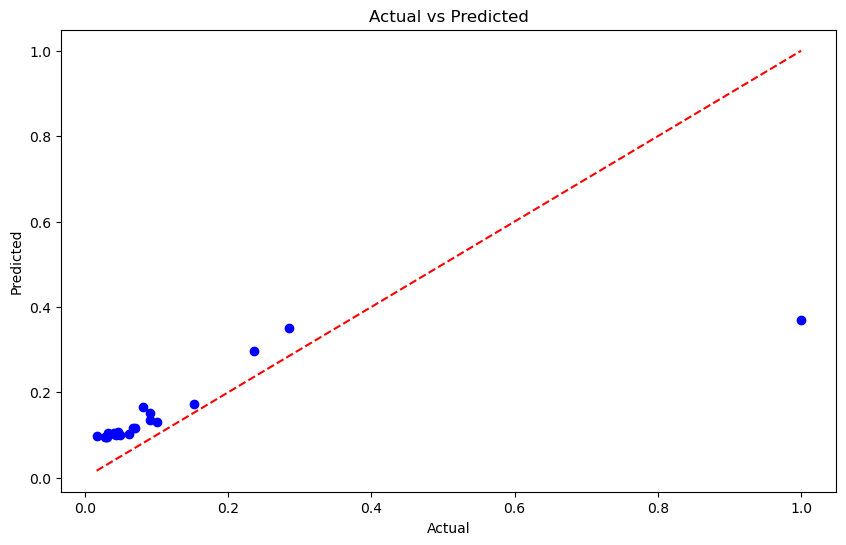

In [33]:

# Features and target variable
features = ['BUFF', 'MUTTON', 'CHEVON', 'PORK ', 'CHICKEN', 'DUCK MEAT']
target_column = ['TOTAL MEAT']

# Prepare the data
X = merged_df[features]
y = merged_df[target_column]

# Flatten the target variable to a 1-dimensional array
y = np.ravel(y)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train the Support Vector Regression model
svr_model = SVR()
svr_model.fit(X_train, y_train)

# Make predictions
y_pred = svr_model.predict(X_test)

# Evaluate the model
mse_svr = mean_squared_error(y_test, y_pred)
r2_svr = r2_score(y_test, y_pred)

print("Mean Squared Error:", mse_svr)
print("R-squared (R2) Score:", r2_svr)

# Plotting the actual vs predicted values
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred, color='blue')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], '--', color='red')
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.title('Actual vs Predicted')
plt.show()





# Multiple linear Regression

In [34]:

def apply_multiple_linear_regression(merged_df, features, target_column, test_size=0.2, random_state=42):
    # Step 1: Split the data into features (X) and target variable (y)
    X = merged_df[features]
    y = merged_df[target_column]

    # Step 2: Split the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=random_state)

    # Step 3: Choose a model (Multiple Linear Regression)
    mlr_model = LinearRegression()

    # Step 4: Train the model
    mlr_model.fit(X_train, y_train)

    # Step 5: Make predictions
    y_pred_mlr = mlr_model.predict(X_test)

    # Step 6: Evaluate the model
    mae_mlr = mean_absolute_error(y_test, y_pred_mlr)
    mse_mlr = mean_squared_error(y_test, y_pred_mlr)
    rmse_mlr = mean_squared_error(y_test, y_pred_mlr, squared=False)
    r2_mlr = r2_score(y_test, y_pred_mlr)

    print(f'Mean Absolute Error: {mae_mlr:.2f}')
    print(f'Mean Squared Error: {mse_mlr:.2f}')
    print(f'Root Mean Squared Error: {rmse_mlr:.2f}')
    print(f'R-squared (R2) Score: {r2_mlr:.2f}')

    return mlr_model, y_test, y_pred_mlr
# Apply multiple linear regression
trained_mlr_model, true_values, predicted_values = apply_multiple_linear_regression(merged_df, features, target_column)

Mean Absolute Error: 0.00
Mean Squared Error: 0.00
Root Mean Squared Error: 0.00
R-squared (R2) Score: 1.00


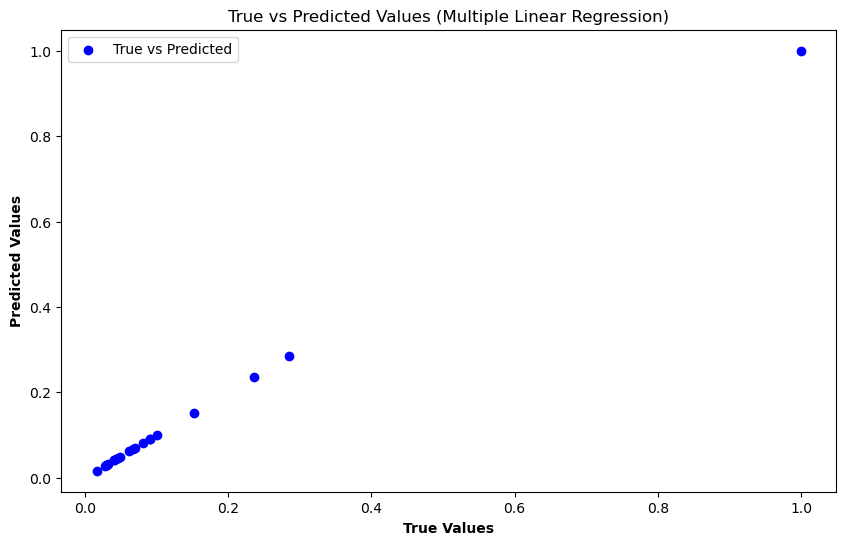

In [35]:

# Scatter plot of true vs predicted values
plt.figure(figsize=(10, 6))
plt.scatter(true_values, predicted_values, color='blue', label='True vs Predicted')

# Add labels and title
plt.xlabel('True Values', fontweight='bold')
plt.ylabel('Predicted Values', fontweight='bold')
plt.title('True vs Predicted Values (Multiple Linear Regression)')

# Add a legend
plt.legend()

# Show plot
plt.show()


# Simple Linear Regression

In [36]:

# Define function for applying linear regression
def apply_linear_regression(merged_df, features, target_column, test_size=0.2, random_state=42):
    # Step 1: Split the data into features (X) and target variable (y)
    X = merged_df[features]
    y = merged_df[target_column]

    # Step 2: Split the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=random_state)

    # Reshape X_train and X_test to be 2D arrays
    X_train = X_train.values.reshape(-1, 1)
    X_test = X_test.values.reshape(-1, 1)
    y_train = y_train.values.reshape(-1, 1)
    y_test = y_test.values.reshape(-1, 1)

    # Step 3: Choose a model (Linear Regression)
    lr_model = LinearRegression()

    # Step 4: Train the model
    lr_model.fit(X_train, y_train)

    # Step 5: Make predictions
    y_pred_lr = lr_model.predict(X_test)

   
    # Calculate Mean Absolute Error
    mae_lr = mean_absolute_error(y_test, y_pred_lr)

    # Calculate Mean Squared Error
    mse_lr = mean_squared_error(y_test, y_pred_lr)

    # Calculate Root Mean Squared Error
    rmse_lr = mean_squared_error(y_test, y_pred_lr, squared=False)

    # Calculate R-squared (R2) score
    r2_lr = r2_score(y_test, y_pred_lr)

    print(f'Mean Absolute Error: {mae_lr:.2f}')
    print(f'Mean Squared Error: {mse_lr:.2f}')
    print(f'Root Mean Squared Error: {rmse_lr:.2f}')
    print(f'R-squared (R2) Score: {r2_lr:.2f}')

    return lr_model, y_test, y_pred_lr  # Return the trained model, true values, and predicted values for evaluation

# Apply linear regression
trained_lr_model, true_values, predicted_values = apply_linear_regression(merged_df, ['SHEEPS NO.'], 'SHEEP WOOL PRODUCED')


Mean Absolute Error: 0.00
Mean Squared Error: 0.00
Root Mean Squared Error: 0.00
R-squared (R2) Score: 1.00


In [37]:
merged_df.to_csv('cleaned_dataset.csv', index=False)